reshape position embedding from 576 to 1024
load checkpoint from /data/noah/ckpt/pretrain_ckpt/BLIP/model_large_caption.pth


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

a series of different photos of a person riding a skateboard


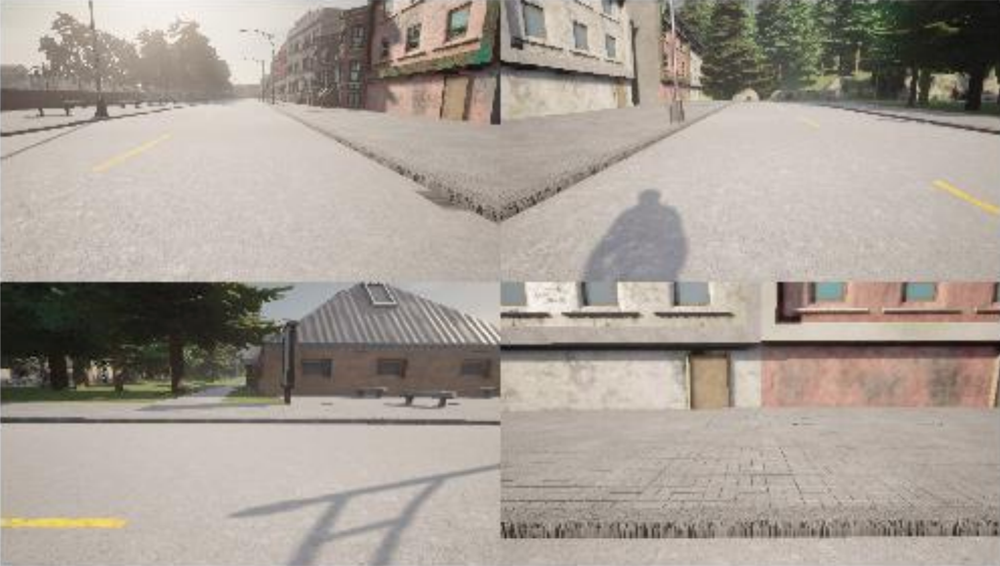

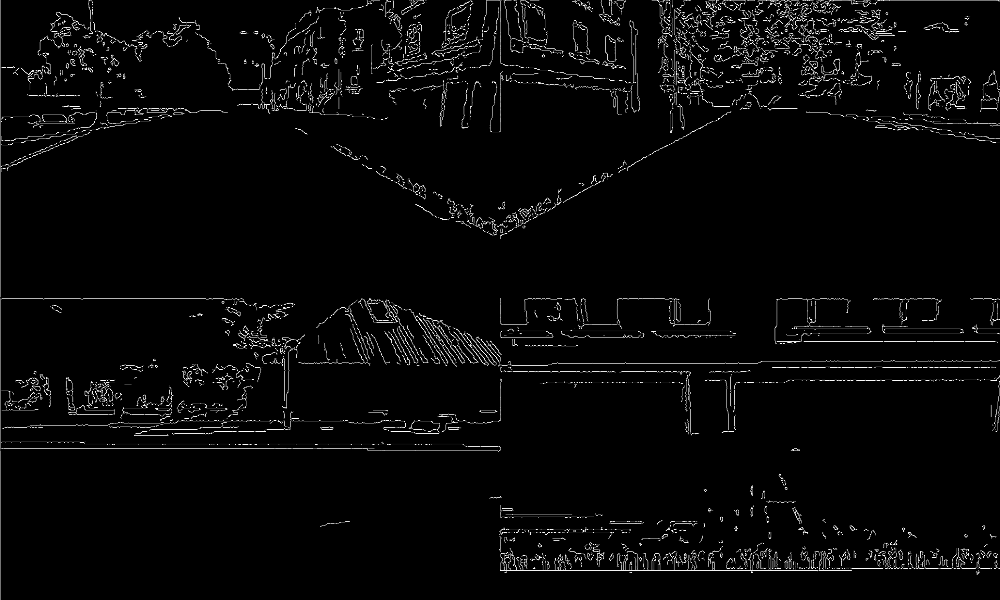

  0%|          | 0/20 [00:00<?, ?it/s]

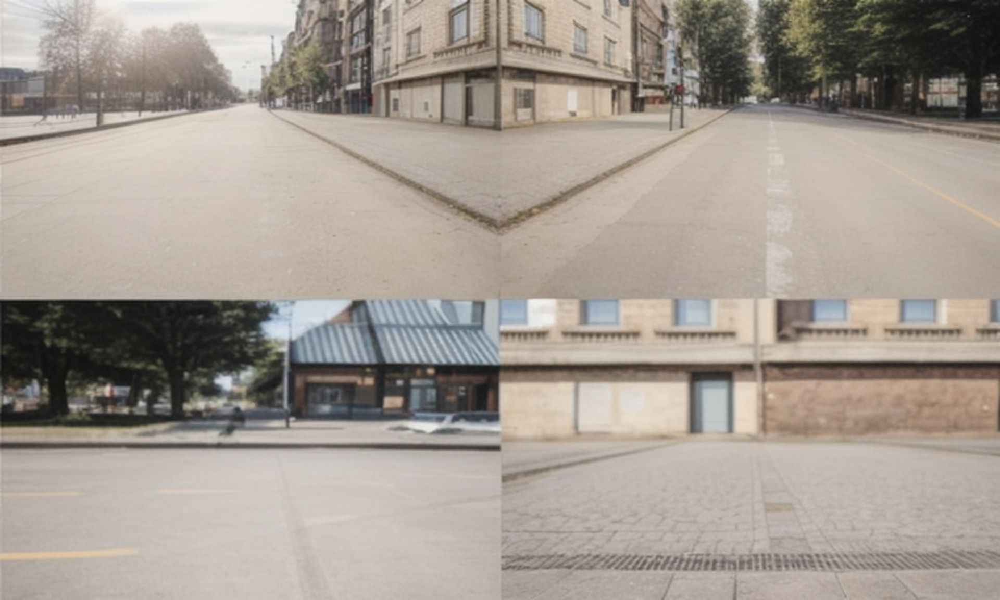

In [33]:
import os
import cv2
import torch
from diffusers import MotionAdapter, StableDiffusionControlNetImg2ImgPipeline, DDIMScheduler, ControlNetModel
from diffusers.utils import export_to_gif, make_image_grid
from PIL import Image as PILImage
from diffusers.utils import load_image
import numpy as np

# from IPython.display import display, Image
from controlnet_aux import CannyDetector
from transformers import CLIPVisionModelWithProjection, CLIPImageProcessor
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
from tqdm import tqdm
from diffusers.blip import blip_decoder

def load_demo_image(image_path, image_size, device):
    raw_image = PILImage.open(image_path).convert("RGB")

    w, h = raw_image.size
    # display(raw_image.resize((w//5,h//5)))

    transform = transforms.Compose(
        [
            transforms.Resize((image_size, image_size), interpolation=InterpolationMode.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
        ]
    )
    image = transform(raw_image).unsqueeze(0).to(device)
    return image


device = "cuda:2"
torch.cuda.set_device(device)

model = blip_decoder(
    pretrained="/data/noah/ckpt/pretrain_ckpt/BLIP/model_large_caption.pth", image_size=512, vit="large"
)
model.eval()
model = model.to(device)

canny = CannyDetector()

# Load the motion adapter
feature_extractor = CLIPImageProcessor()
image_encoder = CLIPVisionModelWithProjection.from_pretrained("openai/clip-vit-large-patch14")
model_id = "/data/noah/ckpt/pretrain_ckpt/StableDiffusion/rv"
lora_id = "/data/noah/ckpt/pretrain_ckpt/StableDiffusion/lora_detail"
lora_name = "add_detail.safetensors"

# controlnet = ControlNetModel.from_pretrained("/data/noah/ckpt/finetuning/Control_Canny_SD_AD", torch_dtype=torch.float16).to(
#     device
# )
controlnet = ControlNetModel.from_pretrained("/data/noah/ckpt/pretrain_ckpt/StableDiffusion/controlnet_canny", torch_dtype=torch.float16).to(
    device
)

pipe = StableDiffusionControlNetImg2ImgPipeline.from_pretrained(
    model_id,
    controlnet=controlnet,
    image_encoder=image_encoder,
    feature_extractor=feature_extractor,
    torch_dtype=torch.float16,
)
pipe.enable_freeu(s1=0.9, s2=0.2, b1=1.2, b2=1.4)
pipe.load_lora_weights(lora_id, weight_name=lora_name)
pipe = pipe.to(device)

image_paths = "/data/noah/inference/magna_style_matching"

for image_path in os.listdir(image_paths):
    image_path = os.path.join(image_paths, image_path)
    blip_image = load_demo_image(image_path=image_path, image_size=512, device=device)
    with torch.no_grad():
        caption = model.generate(blip_image, sample=True, top_p=0.9, max_length=20, min_length=5)[0]
        print(caption)
    image = load_image(image_path).convert("RGB")    
    
    display(image)
    
    control_image = canny(
        image, detect_resolution=image.height, image_resolution=image.height, low_threshold=50, high_threshold=100 #150
    )

    display(control_image)
    
    prompt = "{}, clear weather, outdoor, best quality, extremely detailed, clearness, naturalness, film grain, crystal clear, photo with color, actuality, <lora:add-detail:1>".format(
        'multiple pictures of a street in same locations'
        # caption
    )
    negative_prompt = "cartoon, anime, painting, disfigured, immature, blur, picture, 3D, render, semi-realistic, drawing, poorly drawn, bad anatomy, wrong anatomy, gray scale, worst quality, low quality, sketch"

    result_image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image,
        control_image=control_image,
        height=512,  # 512
        width=768,  # 768
        guidance_scale=6.5,  # 7
        num_inference_steps=40,  # 20
        controlnet_conditioning_scale=0.75,
        strength=0.5,
        # ip_adapter_image=image,
        generator=torch.Generator().manual_seed(42),
    ).images[0]

    new_w, new_h = control_image.width, control_image.height
    result_image = result_image.resize((new_w, new_h))
    
    display(result_image)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

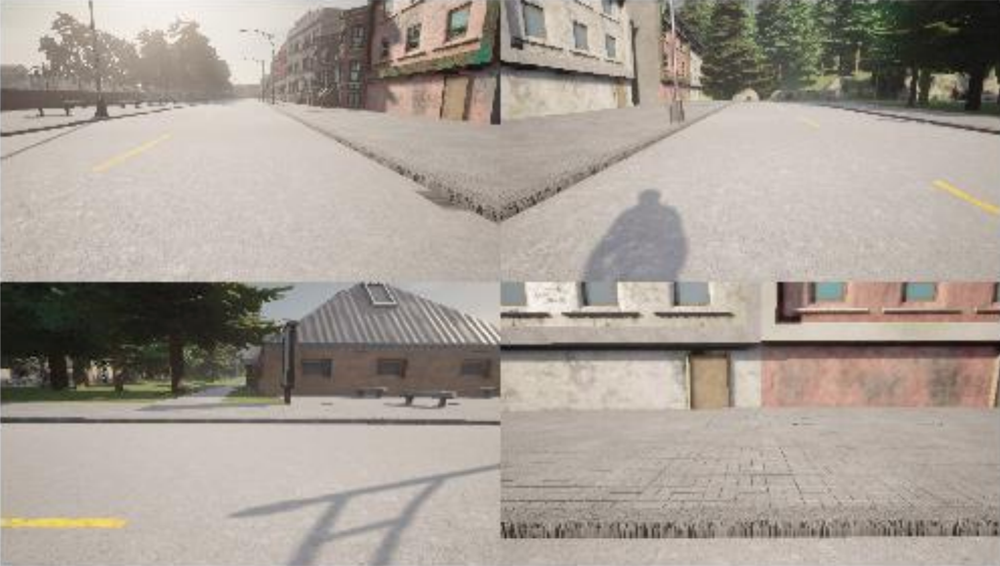

  0%|          | 0/14 [00:00<?, ?it/s]

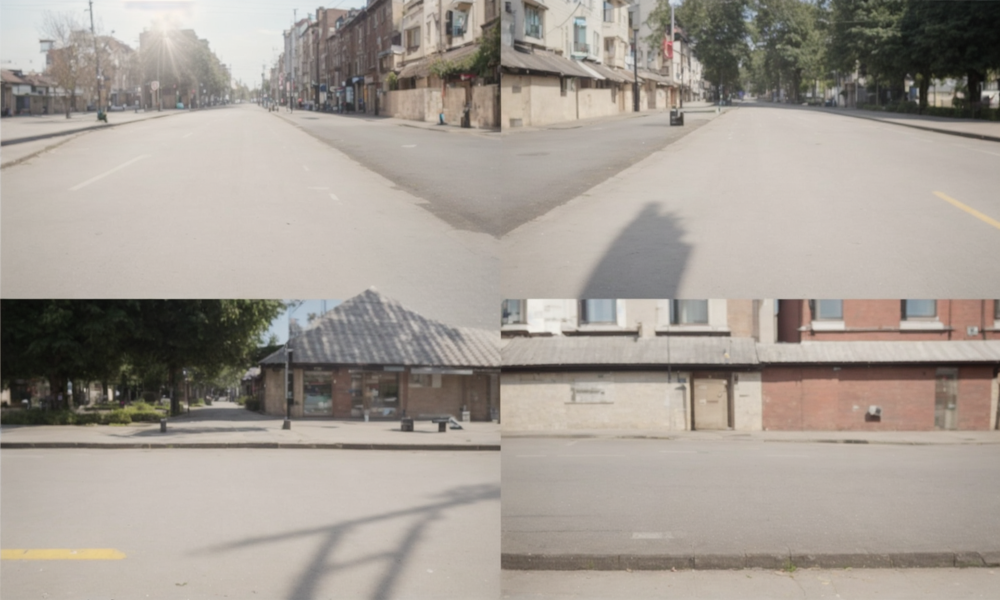

In [36]:
import os
import cv2
import torch
from diffusers import MotionAdapter, StableDiffusionImg2ImgPipeline, DDIMScheduler, ControlNetModel
from diffusers.utils import export_to_gif, make_image_grid
from PIL import Image as PILImage
from diffusers.utils import load_image
import numpy as np

# from IPython.display import display, Image
from controlnet_aux import CannyDetector
from transformers import CLIPVisionModelWithProjection, CLIPImageProcessor
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode
from tqdm import tqdm
from diffusers.blip import blip_decoder

def load_demo_image(image_path, image_size, device):
    raw_image = PILImage.open(image_path).convert("RGB")

    w, h = raw_image.size
    # display(raw_image.resize((w//5,h//5)))

    transform = transforms.Compose(
        [
            transforms.Resize((image_size, image_size), interpolation=InterpolationMode.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
        ]
    )
    image = transform(raw_image).unsqueeze(0).to(device)
    return image


device = "cuda:2"
torch.cuda.set_device(device)

# Load the motion adapter
feature_extractor = CLIPImageProcessor()
image_encoder = CLIPVisionModelWithProjection.from_pretrained("openai/clip-vit-large-patch14")
model_id = "/data/noah/ckpt/pretrain_ckpt/StableDiffusion/rv"
lora_id = "/data/noah/ckpt/pretrain_ckpt/StableDiffusion/lora_detail"
lora_name = "add_detail.safetensors"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id,
    image_encoder=image_encoder,
    feature_extractor=feature_extractor,
    torch_dtype=torch.float16,
)
pipe.enable_freeu(s1=0.9, s2=0.2, b1=1.2, b2=1.4)
pipe.load_lora_weights(lora_id, weight_name=lora_name)
pipe = pipe.to(device)

image_paths = "/data/noah/inference/magna_style_matching"

for image_path in os.listdir(image_paths):
    image_path = os.path.join(image_paths, image_path)
    image = load_image(image_path).convert("RGB")    
    
    display(image)
        
    prompt = "{}, clear weather, outdoor, best quality, extremely detailed, clearness, naturalness, film grain, crystal clear, photo with color, actuality, <lora:add-detail:1>".format(
        'multiple pictures of a street in same locations'
        # caption
    )
    negative_prompt = "cartoon, anime, painting, disfigured, immature, blur, picture, 3D, render, semi-realistic, drawing, poorly drawn, bad anatomy, wrong anatomy, gray scale, worst quality, low quality, sketch"

    result_image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image,
        height=512,  # 512
        width=768,  # 768
        guidance_scale=7.5,  # 7
        num_inference_steps=40,  # 20
        strength=0.35,
        # ip_adapter_image=image,
        generator=torch.Generator().manual_seed(42),
    ).images[0]

    new_w, new_h = control_image.width, control_image.height
    result_image = result_image.resize((new_w, new_h))
    
    display(result_image)